In [1]:
import os
import re
import numpy as np
import scipy.io as sio
import imageio
import tqdm
import matplotlib.pyplot as plt
from matplotlib.animation import FFMpegWriter
# from utlis.projection import *                                 
from utlis.com_traga_utlis import load_data, plot_3d_trajectory, detect_jumps, generate_jump_video,generate_com_video #generate_com_video_choice#*
# from utlis.com_traga_utlis import plot_com_all, process_folders, temp_change_calib_pos_to_0, generate_dannce_vid_seq# *

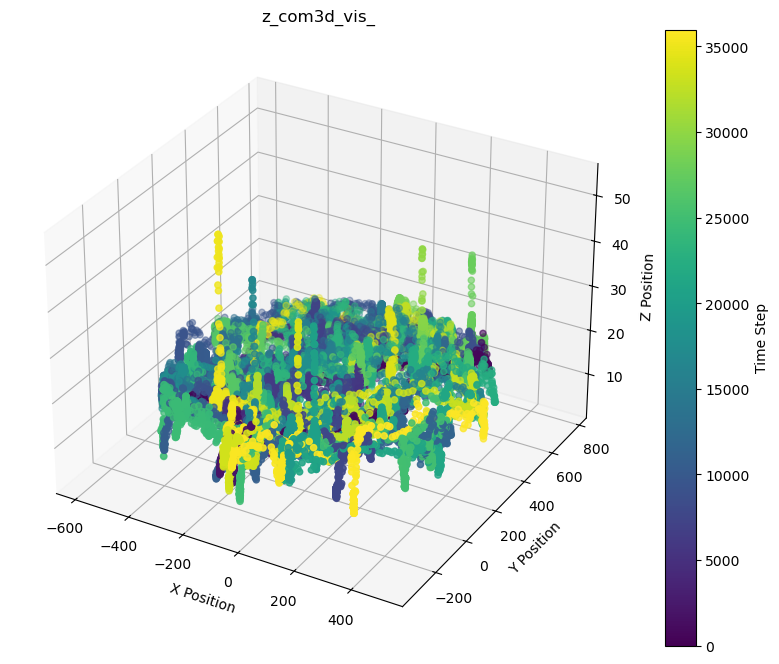

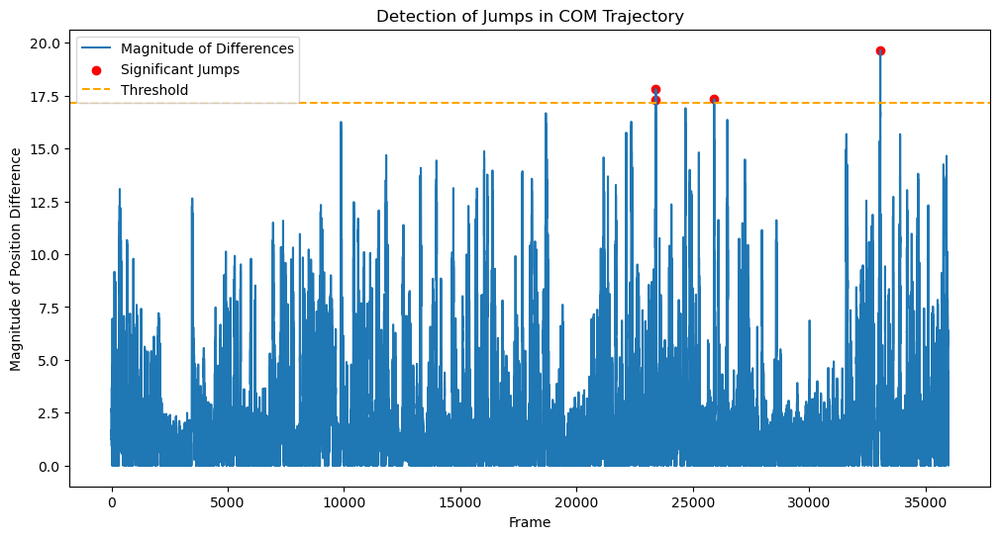

saved into npy. Frames with significant jumps: [23407 23408 25916 33057]
4
N_FRAMES 4
pred_2d 4


100%|██████████| 4/4 [00:18<00:00,  4.63s/it]


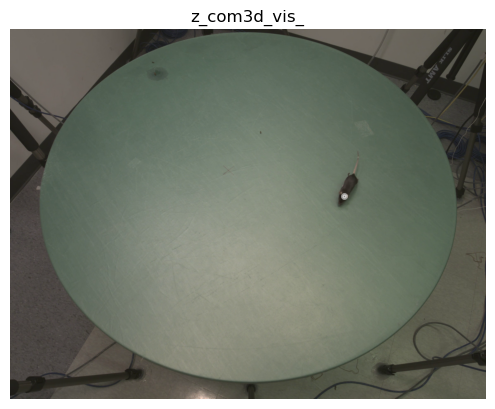

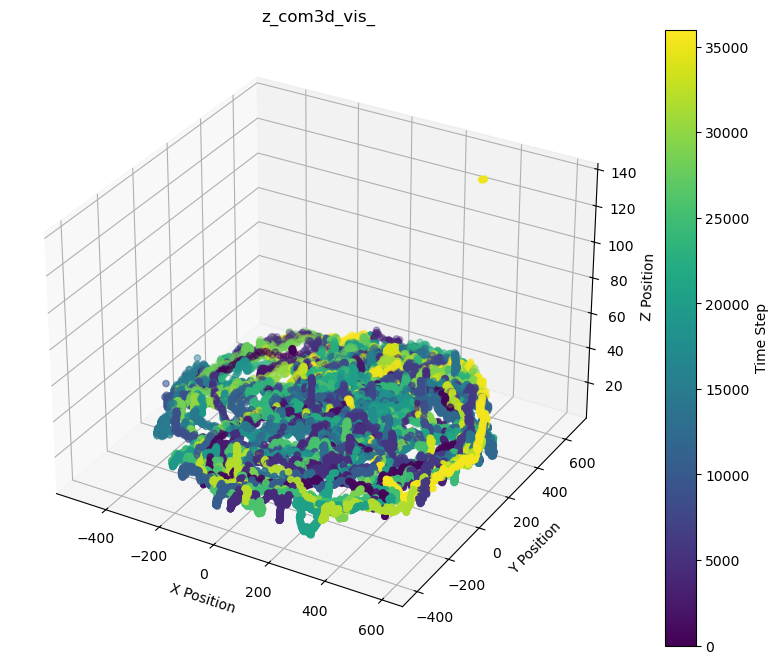

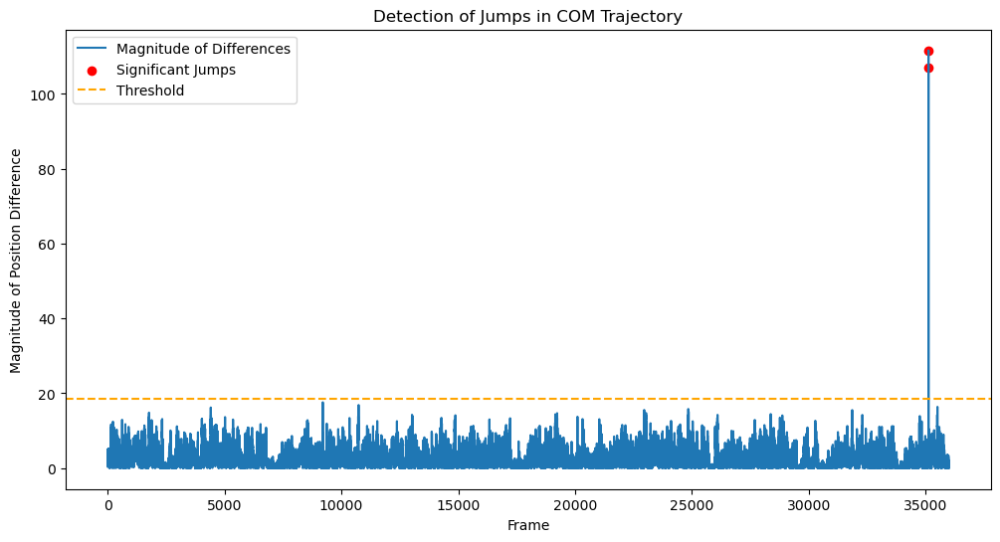

saved into npy. Frames with significant jumps: [35117 35121]
2
N_FRAMES 2
pred_2d 2


100%|██████████| 2/2 [00:07<00:00,  3.66s/it]


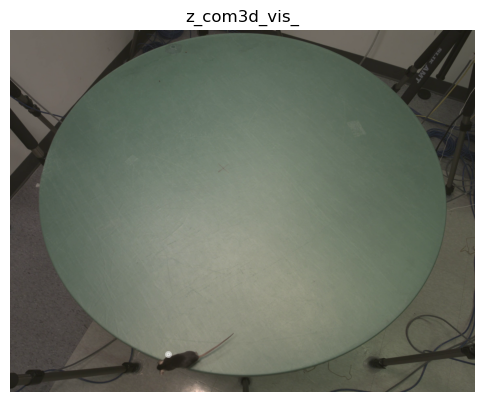

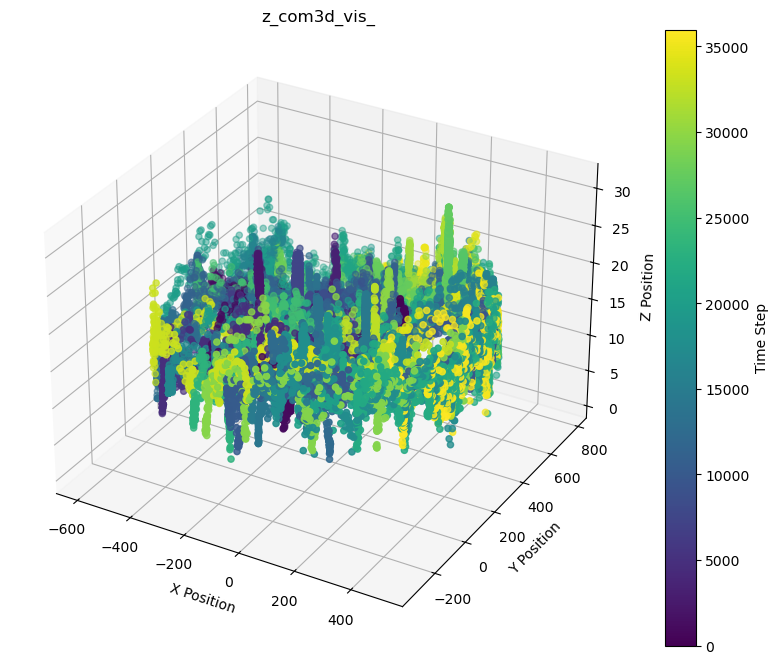

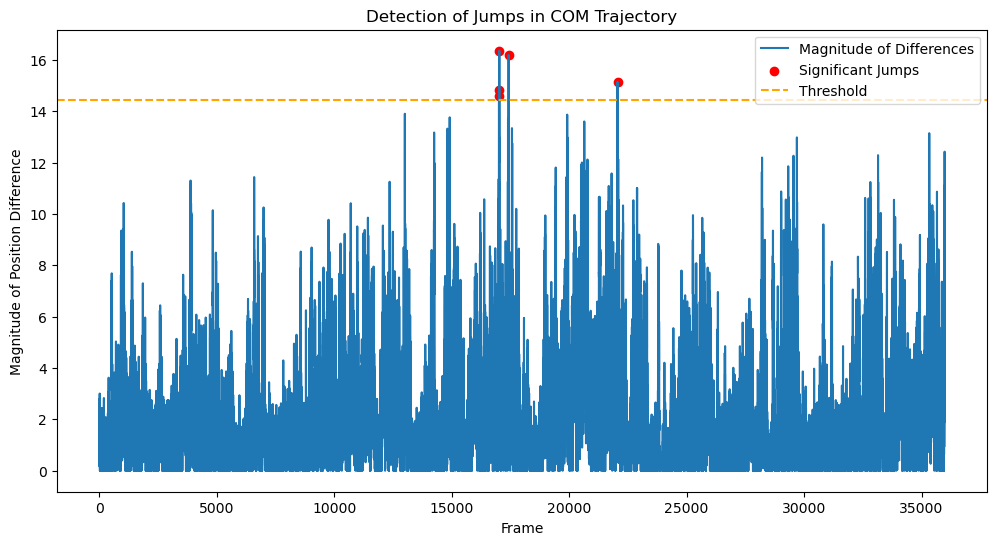

saved into npy. Frames with significant jumps: [17012 17013 17028 17422 22059]
5
N_FRAMES 5
pred_2d 5


100%|██████████| 5/5 [00:30<00:00,  6.03s/it]


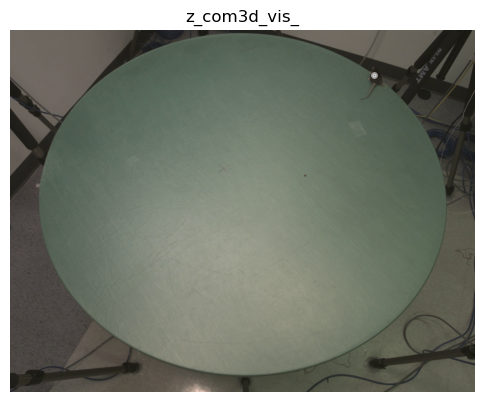

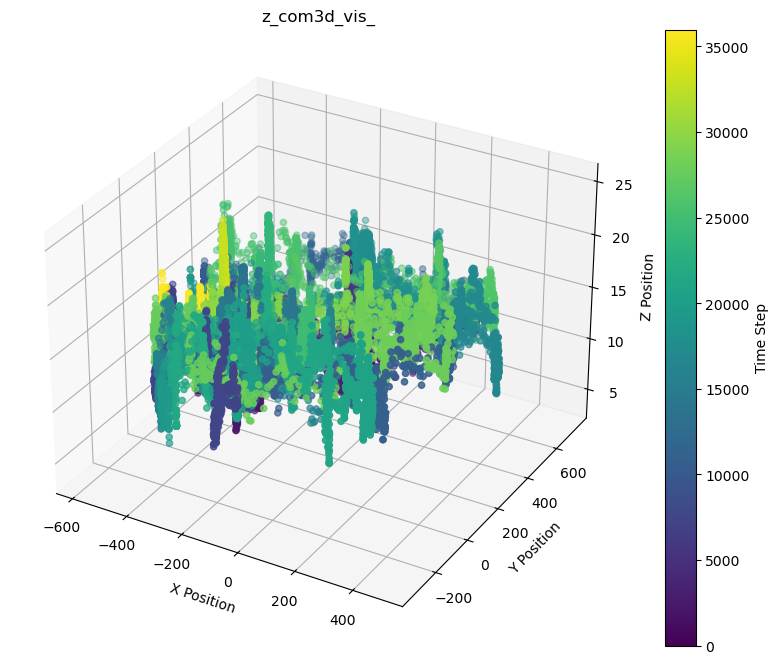

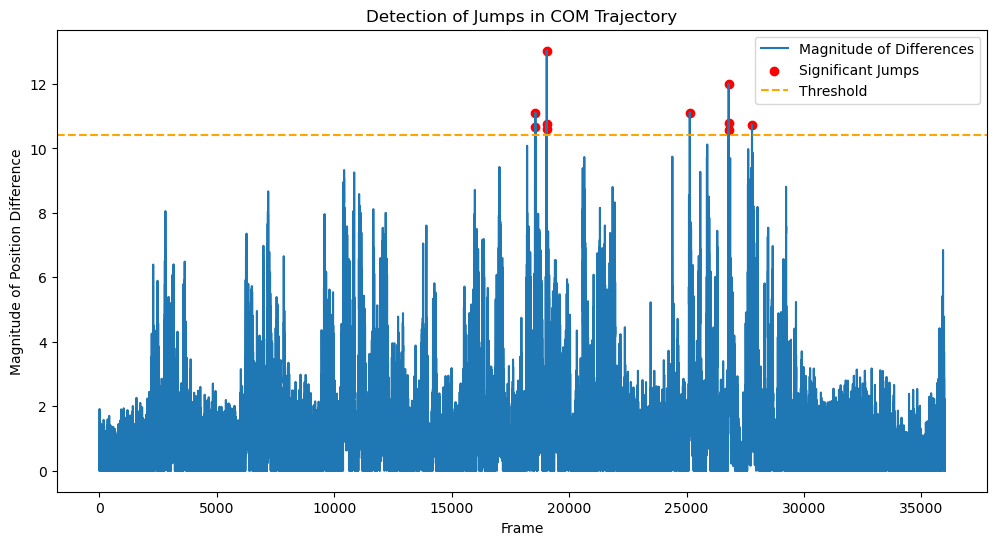

saved into npy. Frames with significant jumps: [18548 18564 19037 19038 19047 25135 26792 26794 26802 27785]
10
N_FRAMES 10
pred_2d 10


100%|██████████| 10/10 [00:44<00:00,  4.47s/it]


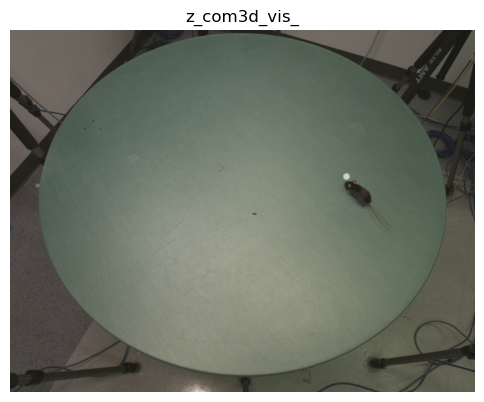

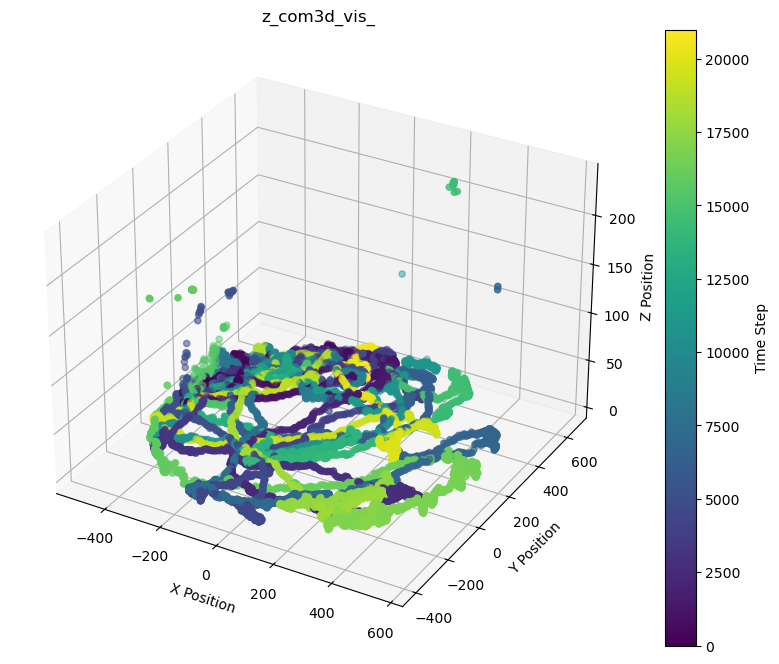

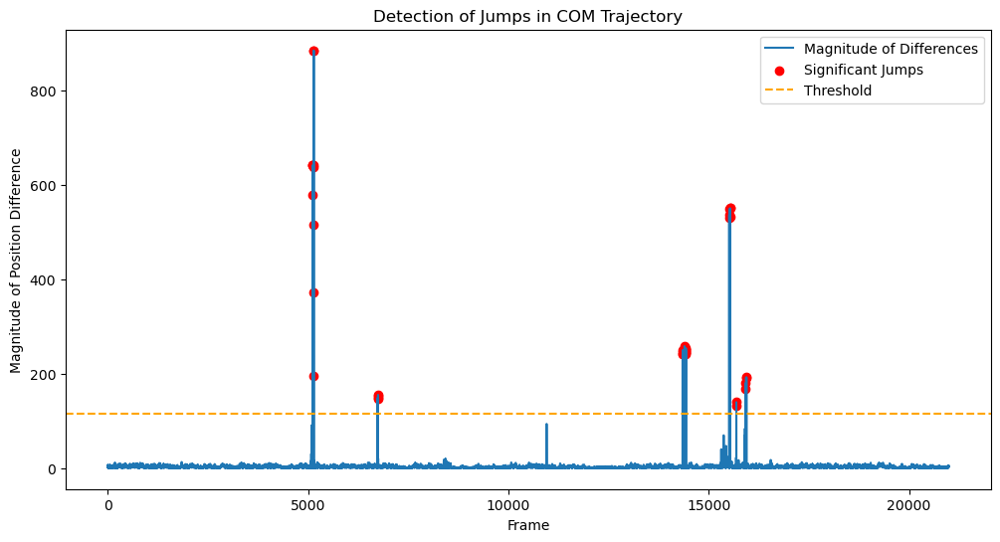

saved into npy. Frames with significant jumps: [ 5117  5118  5121  5122  5123  5124  5128  5134  5143  5144  5145  6739
  6740  6746  6747 14346 14347 14350 14351 14395 14396 14410 14411 14422
 14424 14427 14428 14429 14431 15510 15523 15526 15528 15530 15531 15686
 15688 15915 15916 15932 15941]
41
N_FRAMES 41
pred_2d 41


100%|██████████| 41/41 [01:11<00:00,  1.74s/it]


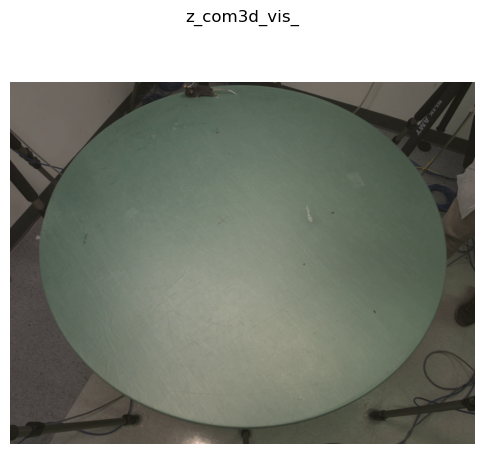

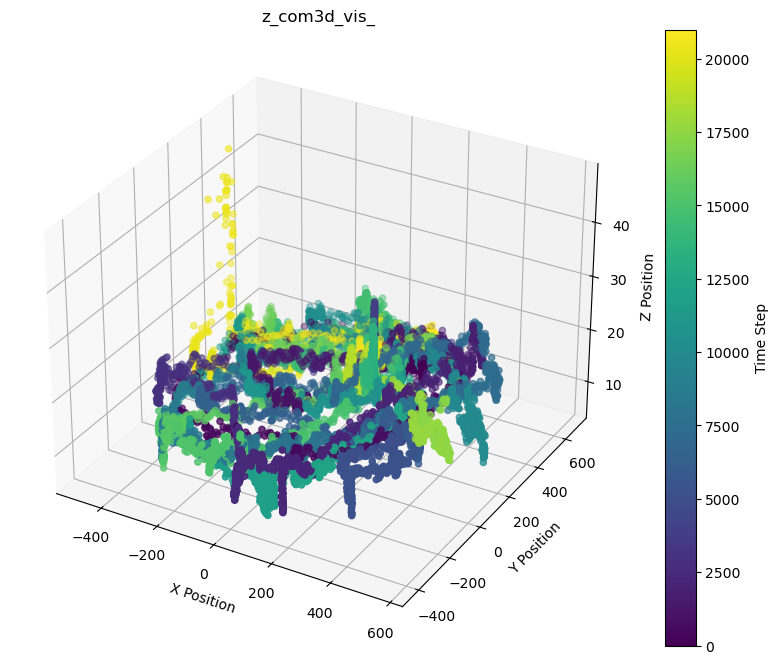

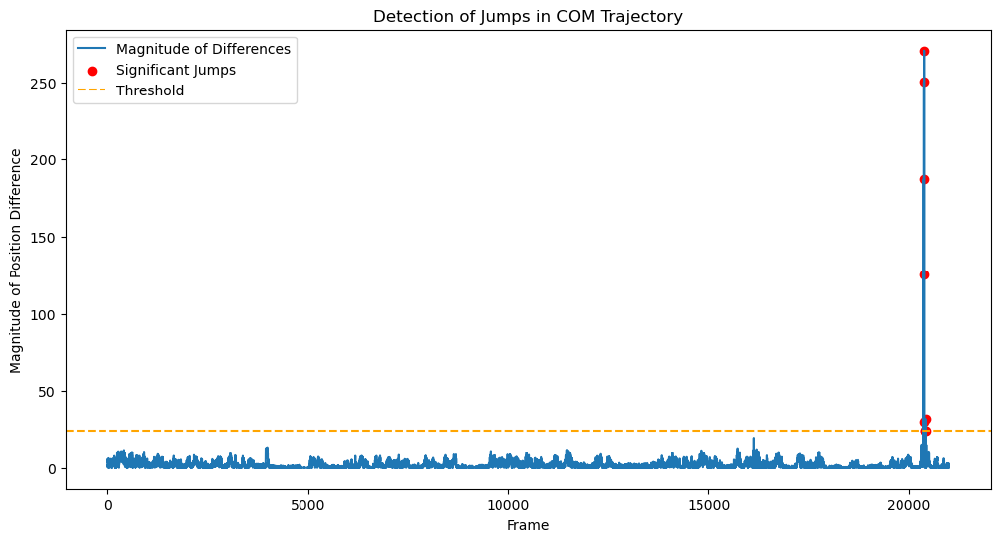

saved into npy. Frames with significant jumps: [20370 20373 20375 20380 20387 20412 20415 20422 20423]
9
N_FRAMES 9
pred_2d 9


100%|██████████| 9/9 [00:11<00:00,  1.25s/it]


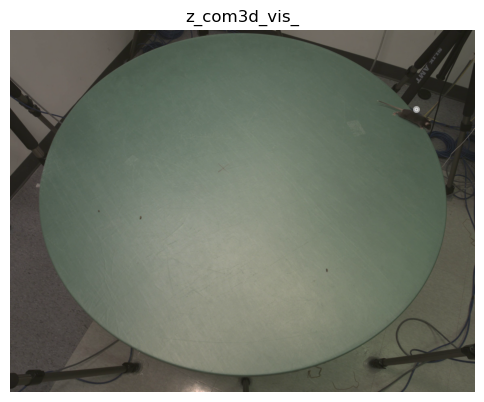

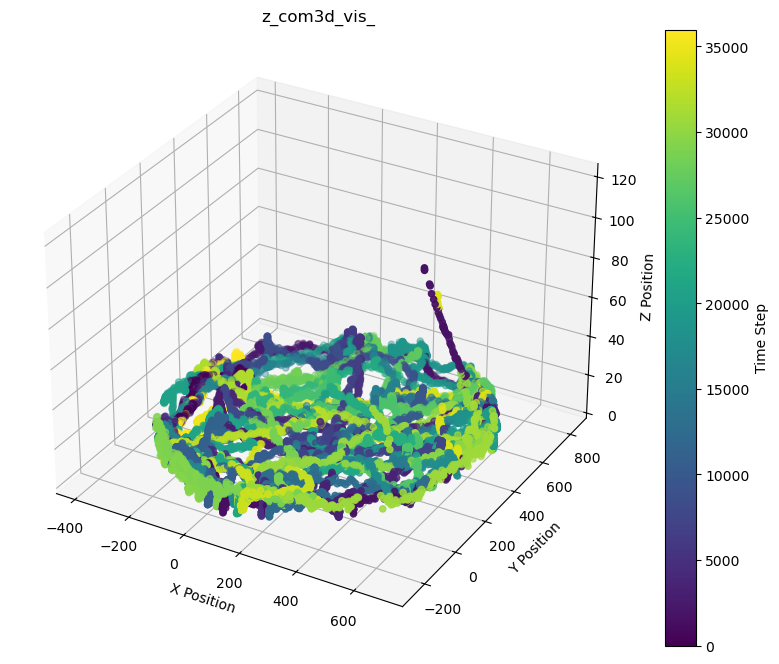

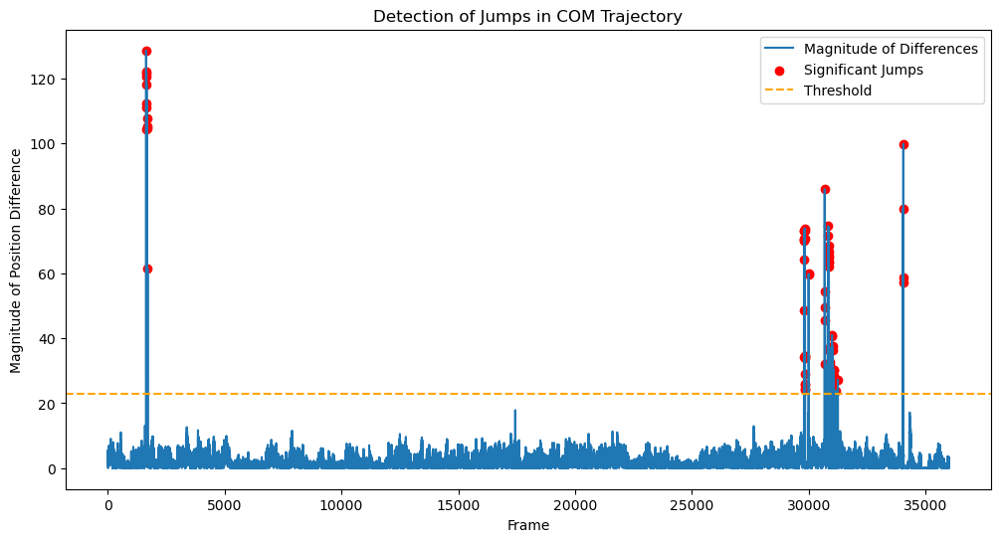

saved into npy. Frames with significant jumps: [ 1643  1646  1658  1661  1662  1668  1669  1671  1675  1677  1678  1712
 29793 29795 29802 29809 29810 29811 29812 29813 29814 29824 29825 29826
 29833 29834 29835 29837 29838 29839 29841 29990 29992 30676 30691 30692
 30694 30706 30834 30835 30836 30839 30841 30842 30849 30850 30854 30877
 30879 30881 30893 30895 30990 30991 31010 31011 31047 31052 31053 31056
 31061 31062 31063 31162 31242 34030 34035 34037 34043]
69
N_FRAMES 69
pred_2d 69


100%|██████████| 69/69 [01:44<00:00,  1.51s/it]


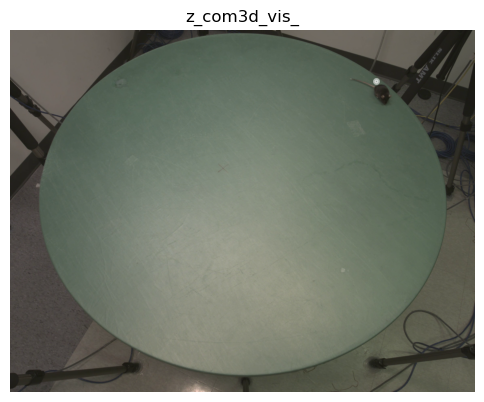

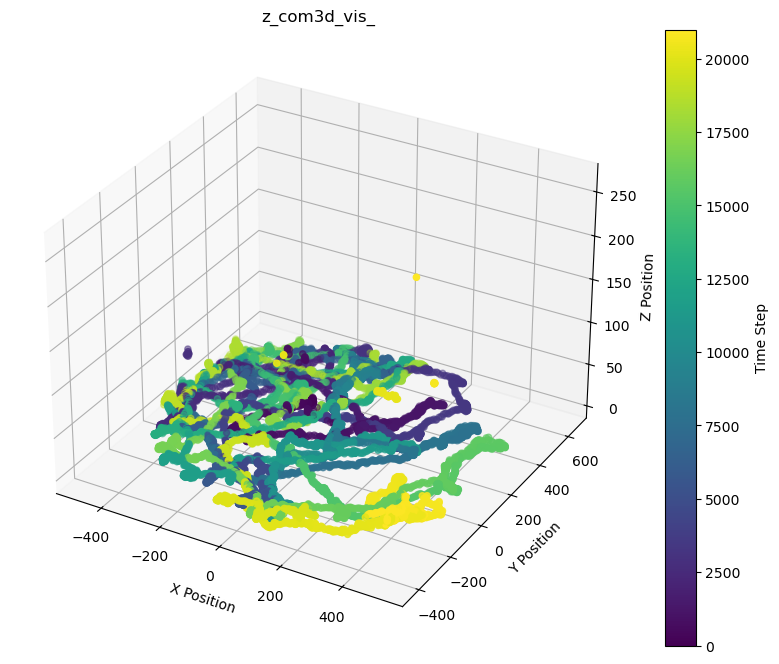

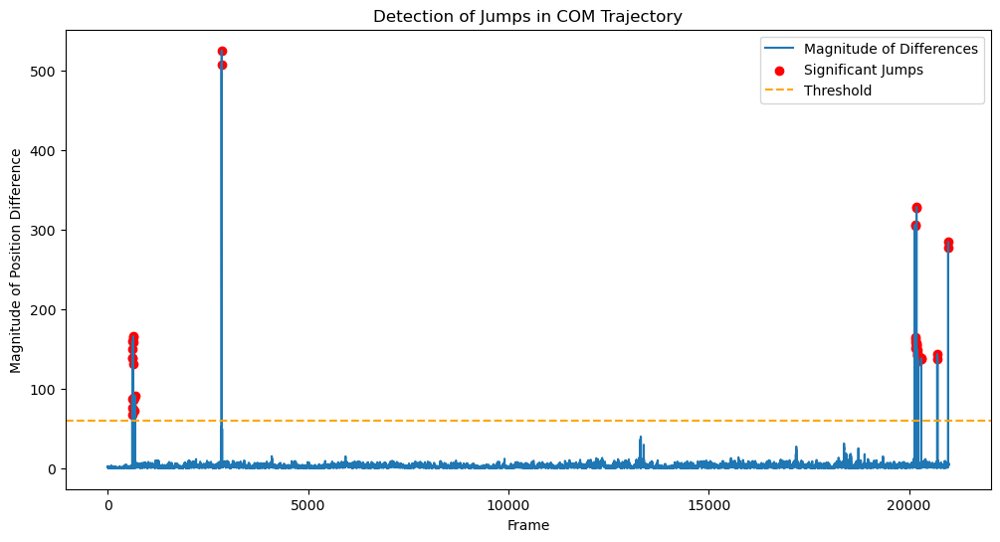

saved into npy. Frames with significant jumps: [  614   615   620   622   624   626   627   633   637   638   639   640
   641   652   653   655   658   669   686  2846  2848 20145 20146 20157
 20162 20167 20168 20170 20174 20183 20184 20185 20187 20194 20197 20204
 20206 20207 20210 20220 20223 20303 20304 20701 20709 20973 20974]
47
N_FRAMES 47
pred_2d 47


100%|██████████| 47/47 [01:01<00:00,  1.31s/it]


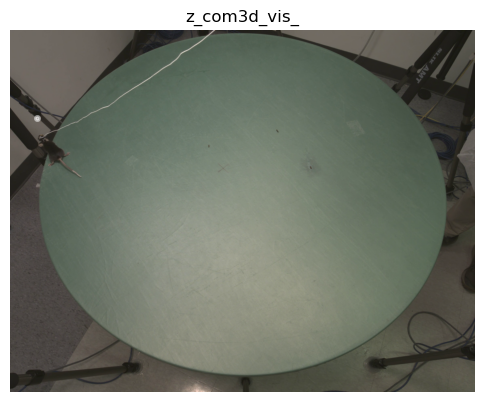

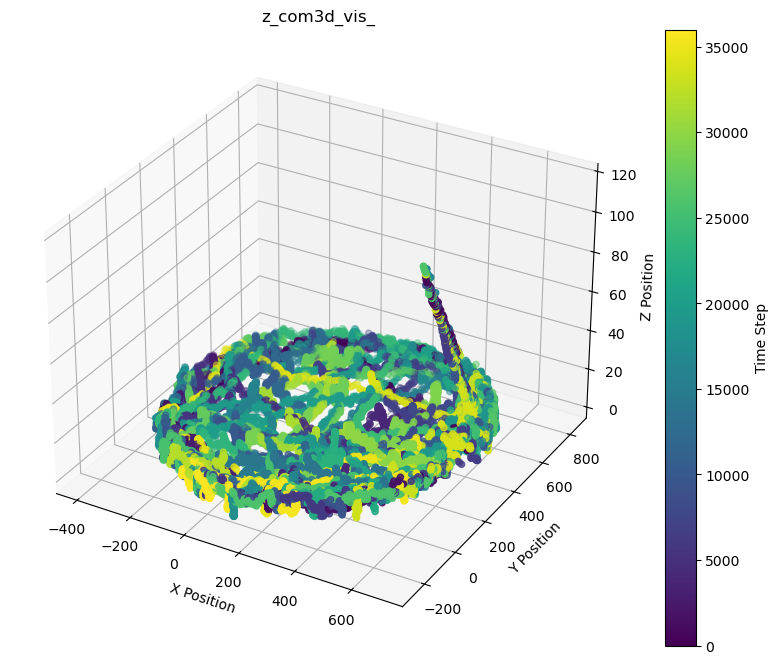

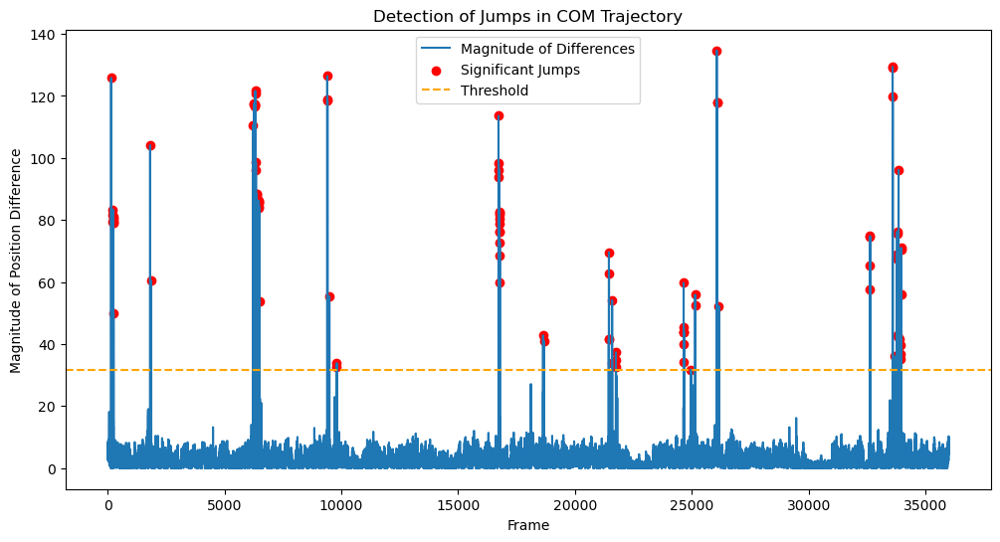

saved into npy. Frames with significant jumps: [  149   224   225   226   227   230   233   236   237   255  1818  1865
  6218  6266  6269  6303  6305  6306  6308  6318  6329  6347  6349  6358
  6360  6362  6369  6373  6375  6456  6457  6468  6469  6476  6477  6492
  9396  9397  9409  9490  9799  9806 16725 16730 16736 16737 16749 16755
 16756 16762 16763 16764 16766 16783 16786 16788 18632 18664 21443 21445
 21450 21453 21581 21587 21747 21748 21752 24645 24646 24649 24653 24654
 24655 24658 24962 25139 25141 26064 26076 26079 26155 32617 32620 32621
 32626 33586 33588 33592 33654 33746 33766 33770 33778 33782 33805 33807
 33843 33887 33907 33938 33944 33950 33952 33953]
104
N_FRAMES 104
pred_2d 104


 60%|█████▉    | 62/104 [01:45<01:25,  2.05s/it]

In [2]:
weired_folders = [
#     # "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_03/1691486_left_right_caffeine_1448",
#     # "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_03/1691486_left_caffeine_1051",
#     # "/home/lq53/mir_data/24summ/2024_07_10/1691485_no_hole_habituation_13_59"
#     # "/home/lq53/mir_data/24summ/2024_06_26/1686940_left"
#     # base_paths = [ 
#     # below 3 need to process from strach.
#     # '/home/lq53/mir_data/24summ/2024_06_26/1686940_left', #validation set
#     # '/home/lq53/mir_data/24summ/2024_06_28/1686941_left_right_2', 
#     # '/home/lq53/mir_data/24summ/2024_07_12/240605PMC1_right_hole_11_27',
#     # # labels
#     "/home/lq53/mir_data/24summ/2024_07_10/1691485_no_hole_habituation_13_59",
#     "/home/lq53/mir_data/24summ/2024_07_11/1691485BMCFF1505",
#     "/home/lq53/mir_data/24summ/2024_07_10/1691485_left_hole_saline_10_35",
#     "/home/lq53/mir_data/24summ/2024_07_03/1691486_left_right_habituation",
#     "/home/lq53/mir_data/24summ/2024_07_19/240605PMC_window2_right2holes_12_14",
#     #below are my labels.
#     # "/home/lq53/mir_data/24summ/2024_07_03/1691486_left_right_habituation",
#     # "/home/lq53/mir_data/24summ/2024_07_12/240605PMC1_right_hole_11_27" #this one did not work
#     "/home/lq53/mir_data/24summ/2024_07_16/1691485RMHBN1405",
#     "/home/lq53/mir_data/24summ/2024_07_15/1691485RMPBS1659",
#     "/home/lq53/mir_data/24summ/2024_07_19/240605PMC_window2_right2holes_11_30",
#     "/home/lq53/mir_data/24summ/2024_07_15/1691485RMHBN1425",
#     "/home/lq53/mir_data/24summ/2024_07_15/1691485RMPBF1531"
#     # 'G:\\Videos\\6cam\\lq53\\Mir_intrinsics\\pyxy3d_noT'
#     # '/n/olveczky_lab_tier1/Lab/dannce_rig2/data/M1-M7_photometry/Alone', SYNTAX_ERROR_UPDATE_THIS_WITH_YOUR_OWN_FILES
#     # '/n/holylabs/LABS/olveczky_lab/Lab/dannce-dev/hannah-data/COM_DANNCE_TRAINING'
# # ]
# ]
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_10/1691485_no_hole_habituation_13_59",
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_11/1691485BMCFF1505",
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_10/1691485_left_hole_saline_10_35",
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_03/1691486_left_right_habituation",
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_19/240605PMC_window2_right2holes_12_14",
    #below are my labels.
    # "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_03/1691486_left_right_habituation"
    # "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_12/240605PMC1_right_hole_11_27" #this one did not work
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_16/1691485RMHBN1405",
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_15/1691485RMPBS1659",
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_19/240605PMC_window2_right2holes_11_30",
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_15/1691485RMHBN1425",
    "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_15/1691485RMPBF1531",
]

for wie in weired_folders:
    # note that there exist a function plot_com_all which i wrote before that can easily do below, 
    # but for somereason i used this just that we can be a bit more flexible in terms of the name of the folders and stuff...

    # /home/lq53/mir_data/24summ/2024_06_26/1686940_left/COM_df/predict_results//vis/vis_combined_Camera2_1000_from_0.mp4
    com_foler = os.path.join(wie, 'COM_df_z_cont/predict_results')
    com_path = os.path.join(com_foler, 'com3d.mat')   
    com_folder_save = os.path.join(com_foler, 'vis')
    if not os.path.exists(com_folder_save):
        os.makedirs(com_folder_save)
    graph_title = "z_com3d_vis_"
    
    com_data = load_data(com_path)

    plot_3d_trajectory(com_data, graph_title, com_folder_save)
    jump_indices = detect_jumps(com_data, com_folder_save)

    # # # produce video, which is not necessary if not labeling more com to detect what's wrong


    save_path = com_folder_save # os.path.join(com_foler, 'vis') #os.path.join(pred_path, 'vis')
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    base_folder = wie
    base_base_folder = os.path.dirname(base_folder)
    generate_jump_video(com_data, base_folder, jump_indices, graph_title, save_path, cam='Camera1')
    # generate_com_video(com_data, base_folder, graph_title, save_path, cam='Camera1')
# generate_com_video_choice # without that much things, just generate. quick iteration made for one click pipeline...

    

pred_2d 100


100%|██████████| 100/100 [00:21<00:00,  4.68it/s]


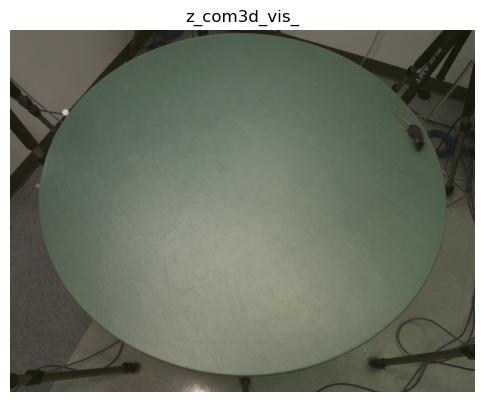

In [3]:
# weired_folders = [

#     '/home/lq53/mir_data/24summ/2024_06_26/1686940_left', #validation set

# ]

# for wie in weired_folders:
#     # note that there exist a function plot_com_all which i wrote before that can easily do below, 
#     # but for somereason i used this just that we can be a bit more flexible in terms of the name of the folders and stuff...

#     # /home/lq53/mir_data/24summ/2024_06_26/1686940_left/COM_df/predict_results//vis/vis_combined_Camera2_1000_from_0.mp4
#     com_foler = os.path.join(wie, 'COM_df_z/predict_results/df_z_240816_6comsets_fromdemo_100fr')
#     com_path = os.path.join(com_foler, 'com3d0.mat')   
#     com_folder_save = os.path.join(com_foler, 'vis')
#     if not os.path.exists(com_folder_save):
#         os.makedirs(com_folder_save)
#     graph_title = "z_com3d_vis_"
    
#     com_data = load_data(com_path)

#     # plot_3d_trajectory(com_data, graph_title, com_folder_save)
#     # jump_indices = detect_jumps(com_data, com_folder_save)

#     # # # produce video, which is not necessary if not labeling more com to detect what's wrong


#     save_path = com_folder_save # os.path.join(com_foler, 'vis') #os.path.join(pred_path, 'vis')
#     if not os.path.exists(save_path):
#         os.makedirs(save_path)
#     base_folder = wie
#     base_base_folder = os.path.dirname(base_folder)
#     # generate_jump_video(com_data, base_folder, jump_indices, graph_title, save_path, cam='Camera1')
#     generate_com_video(com_data, base_folder, graph_title, save_path, cam='Camera1')
# # generate_com_video_choice # without that much things, just generate. quick iteration made for one click pipeline...

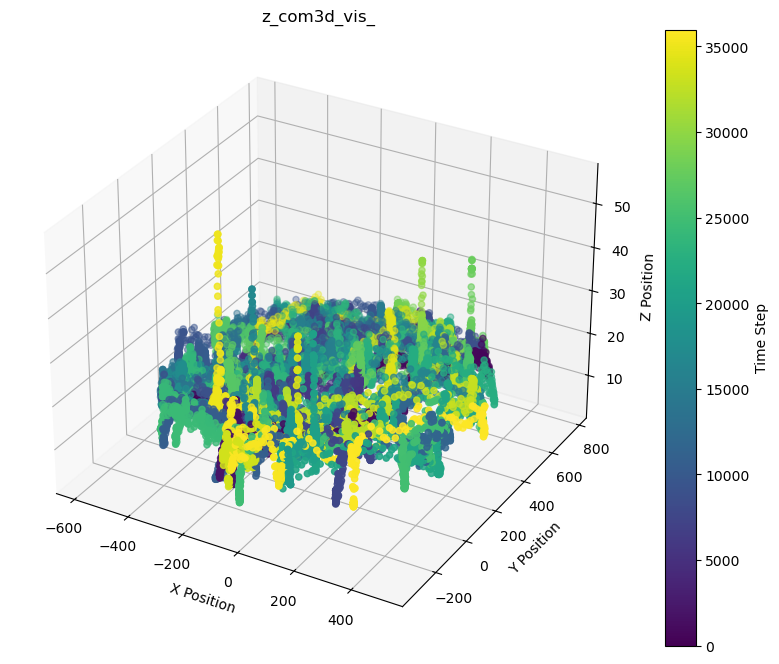

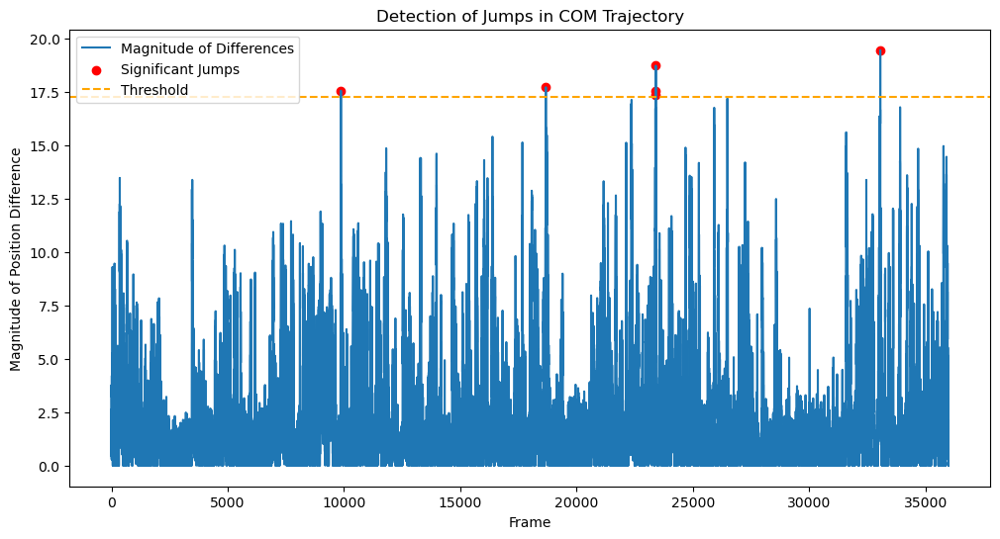

saved into npy. Frames with significant jumps: [ 9867 18678 23407 23408 23409 33057]
6
N_FRAMES 6
pred_2d 6


100%|██████████| 6/6 [00:24<00:00,  4.13s/it]


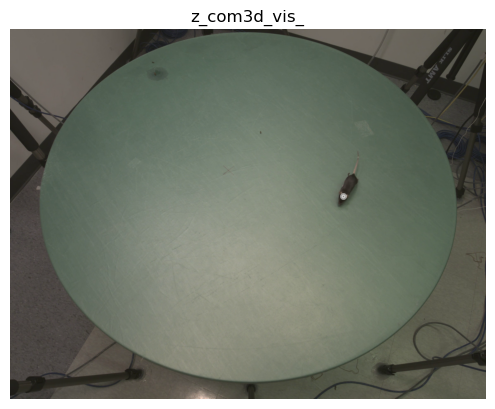

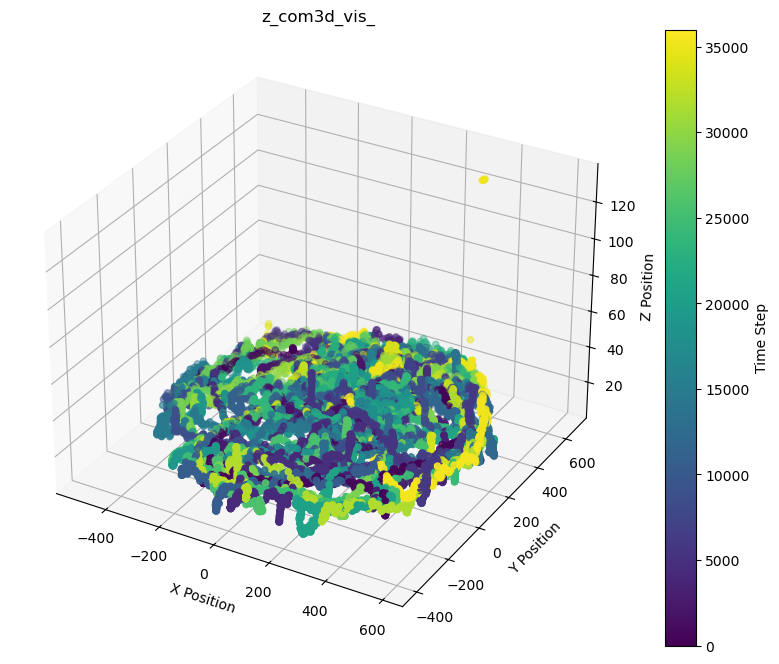

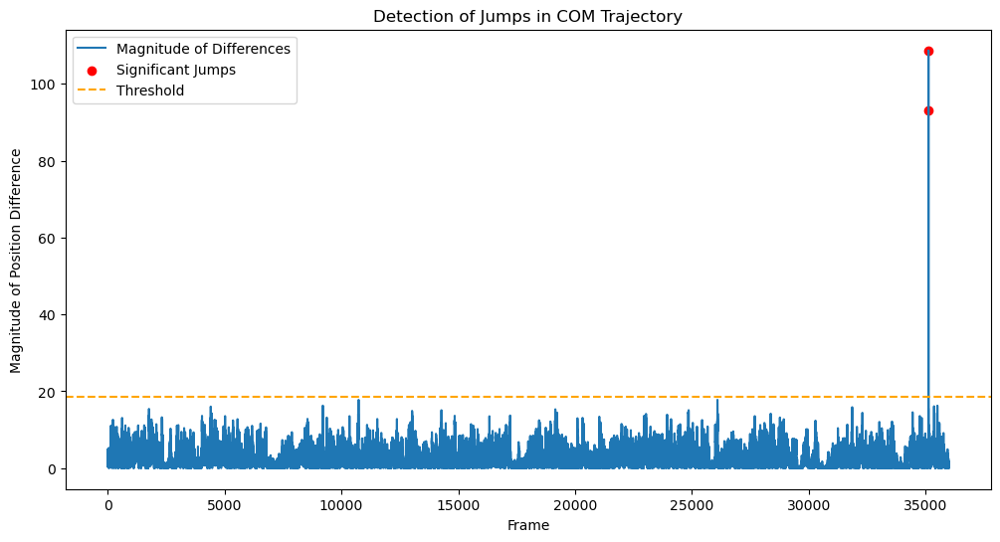

saved into npy. Frames with significant jumps: [35117 35121]
2
N_FRAMES 2
pred_2d 2


100%|██████████| 2/2 [00:06<00:00,  3.21s/it]


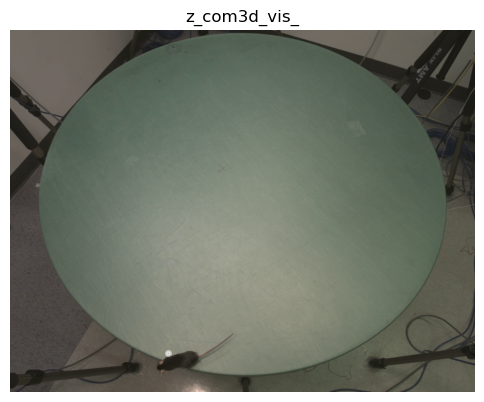

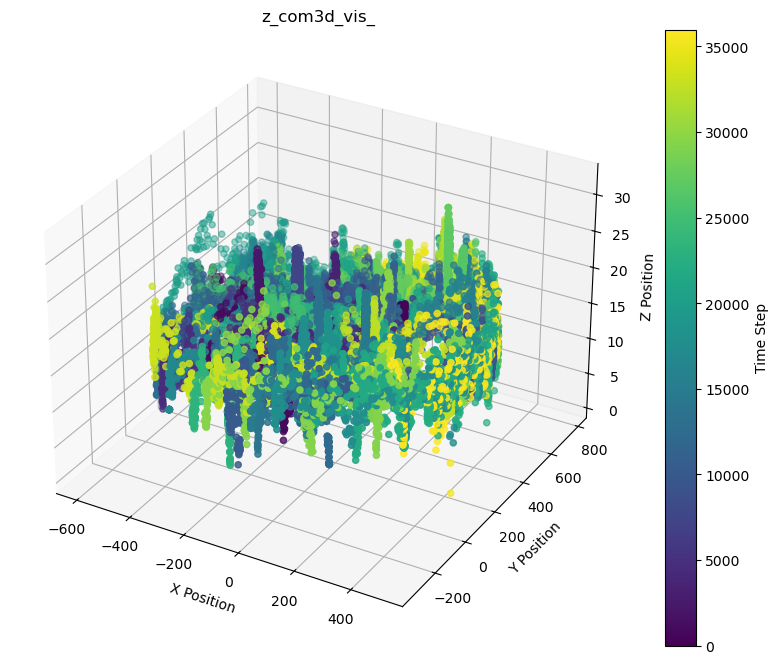

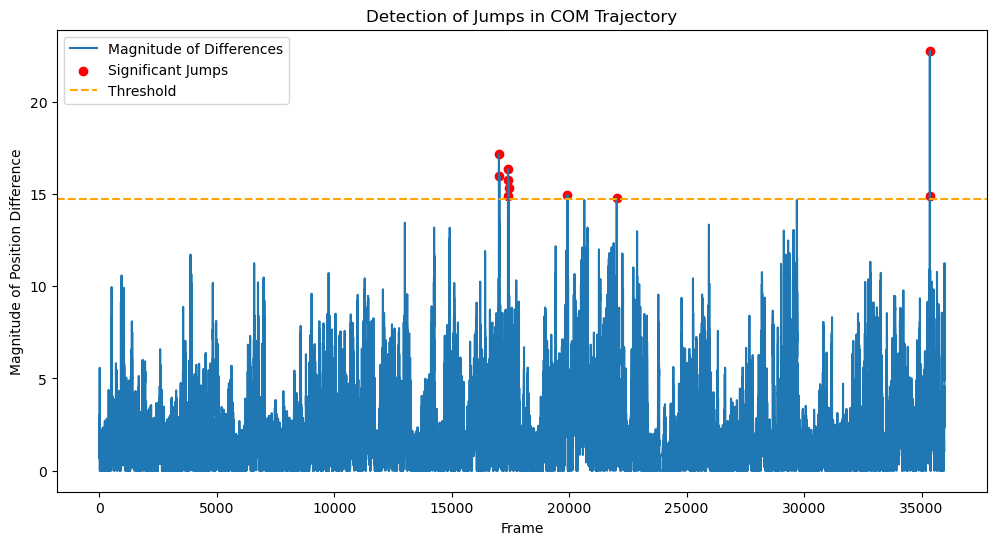

saved into npy. Frames with significant jumps: [17012 17028 17397 17413 17417 17422 19928 22025 35353 35355]
10
N_FRAMES 10
pred_2d 10


100%|██████████| 10/10 [00:42<00:00,  4.28s/it]


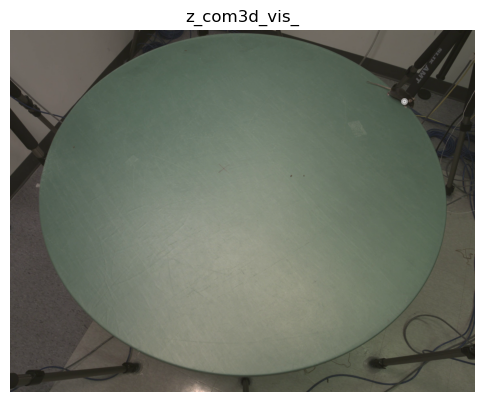

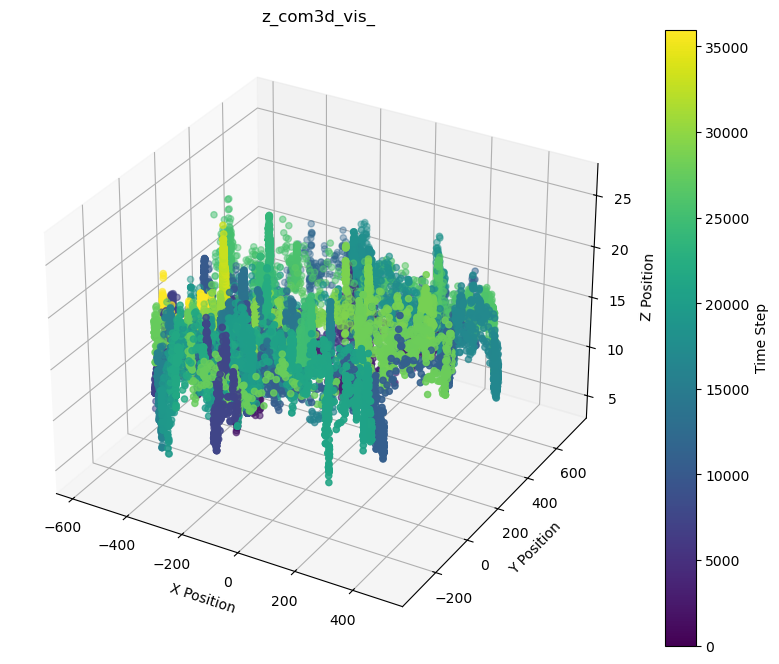

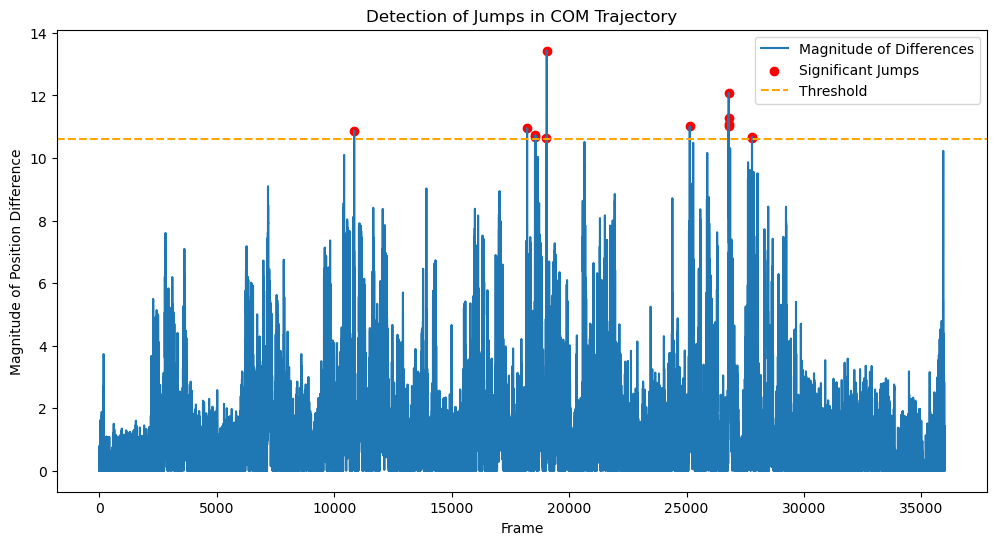

saved into npy. Frames with significant jumps: [10850 18211 18548 18564 19034 19047 25135 26790 26792 26793 26798 27784
 27785]
13
N_FRAMES 13
pred_2d 13


100%|██████████| 13/13 [00:57<00:00,  4.46s/it]


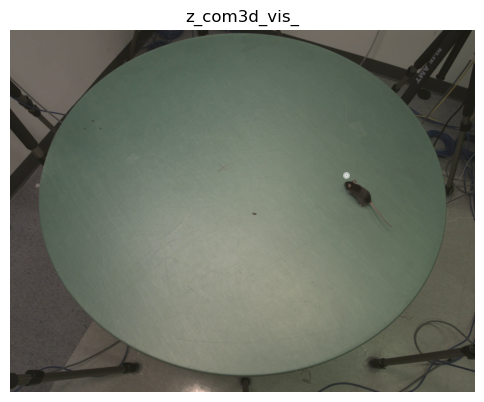

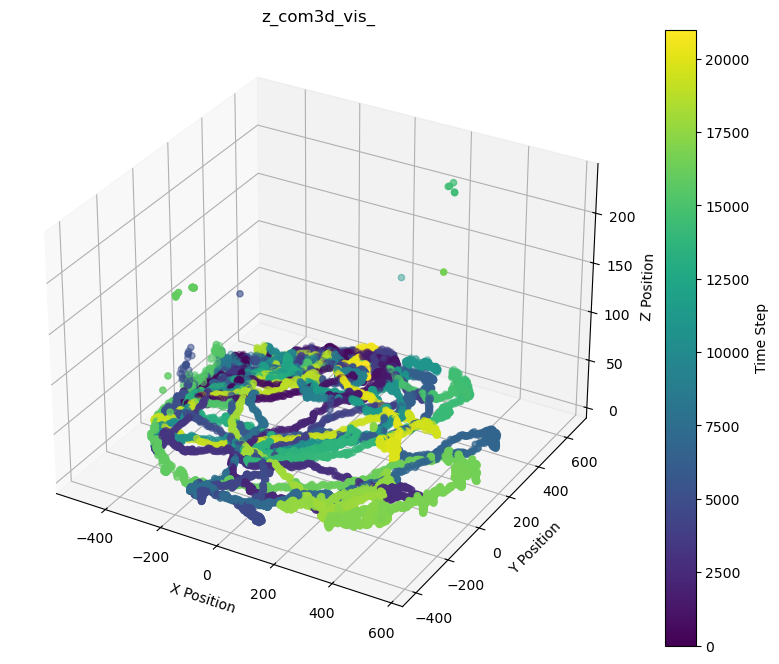

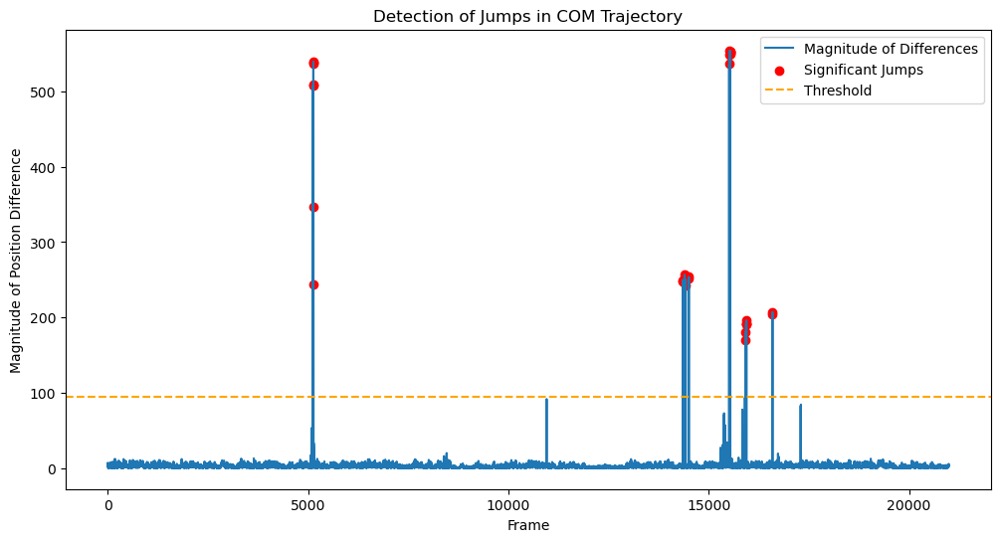

saved into npy. Frames with significant jumps: [ 5126  5130  5132  5133  5134  5135  5136 14349 14351 14395 14396 14423
 14424 14502 14503 15509 15523 15525 15529 15530 15536 15537 15538 15914
 15918 15930 15931 15932 15940 16590 16591]
31
N_FRAMES 31
pred_2d 31


100%|██████████| 31/31 [01:04<00:00,  2.08s/it]


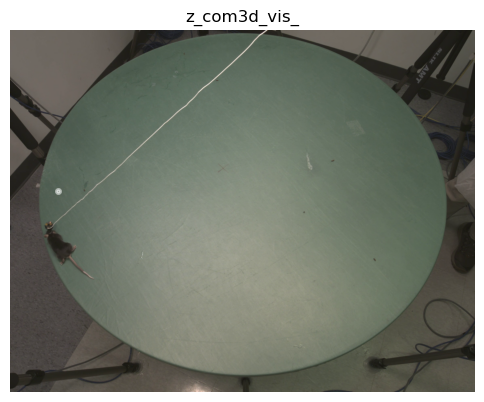

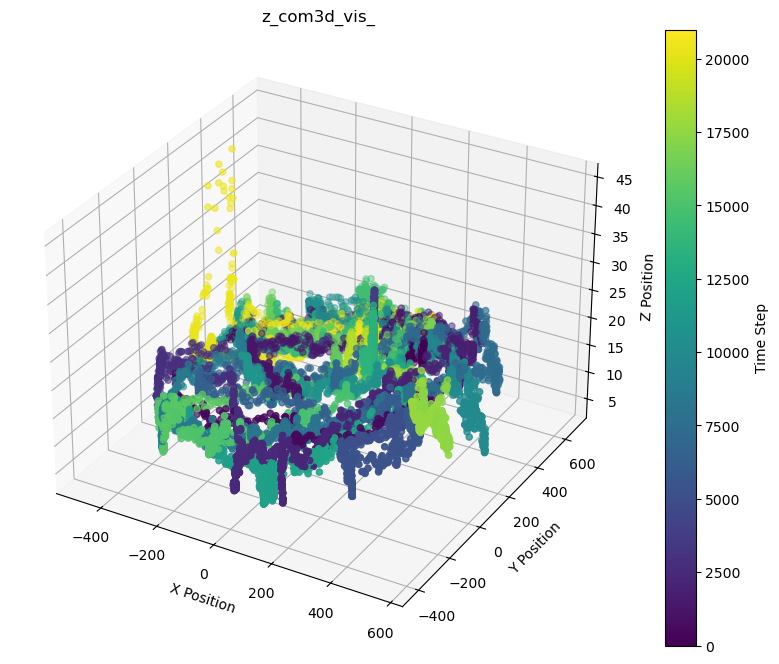

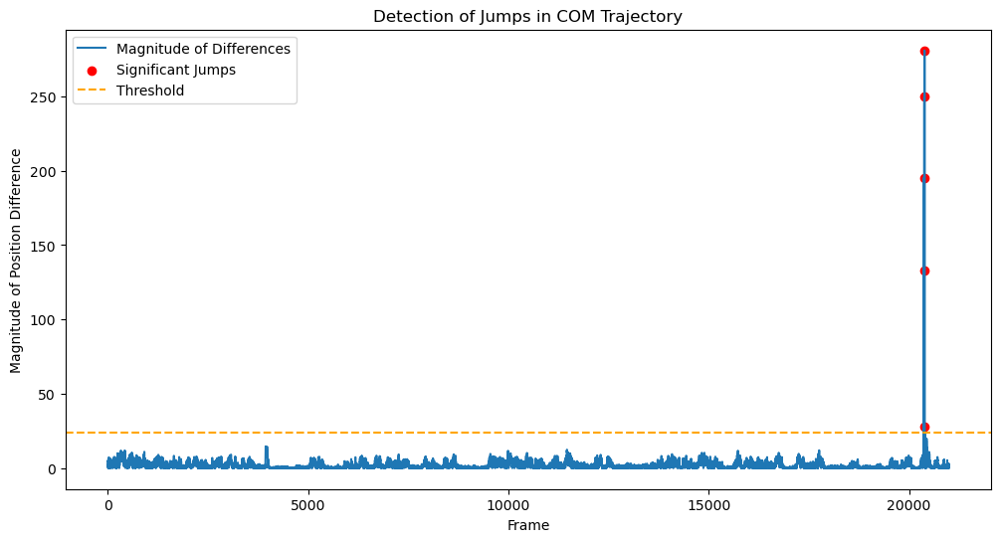

saved into npy. Frames with significant jumps: [20370 20373 20375 20380 20387]
5
N_FRAMES 5
pred_2d 5


100%|██████████| 5/5 [00:08<00:00,  1.67s/it]


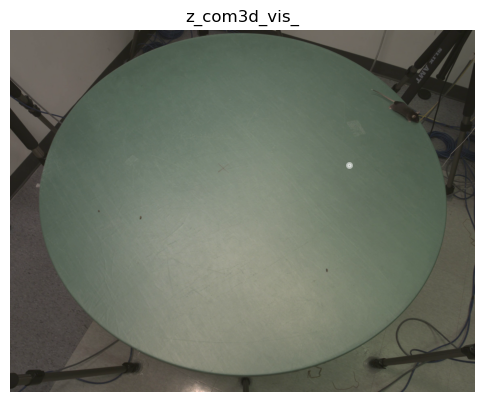

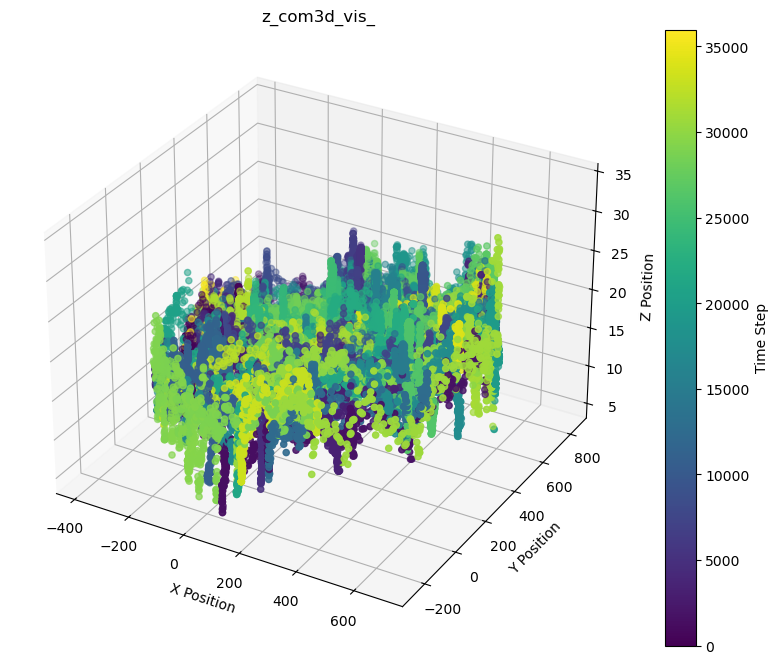

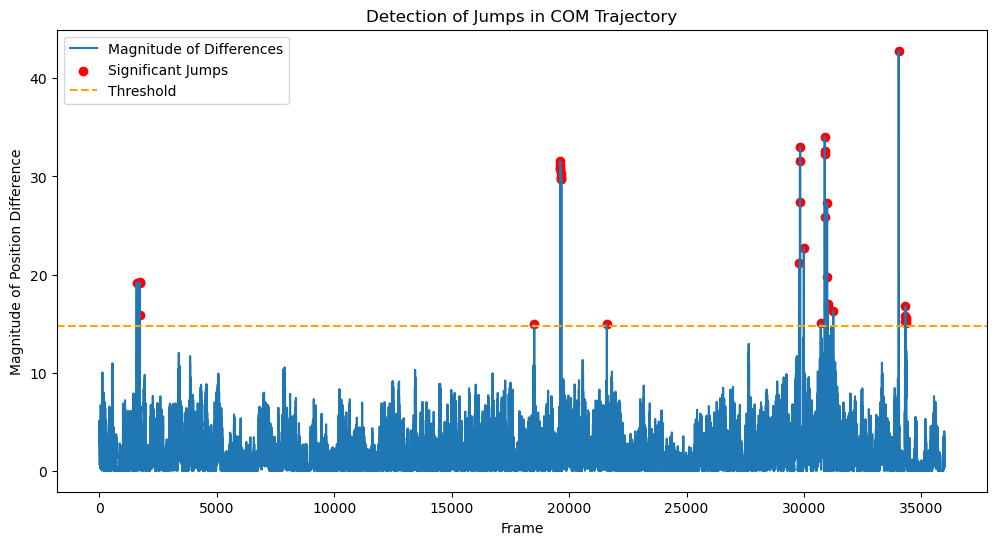

saved into npy. Frames with significant jumps: [ 1588  1714  1724  1725 18516 19621 19622 19625 19626 19648 19649 19659
 19665 21607 29789 29827 29833 29836 29992 30711 30877 30878 30881 30896
 30978 30984 31007 31008 31247 34030 34306 34316 34318 34324 34329 34332]
36
N_FRAMES 36
pred_2d 36


100%|██████████| 36/36 [01:57<00:00,  3.28s/it]


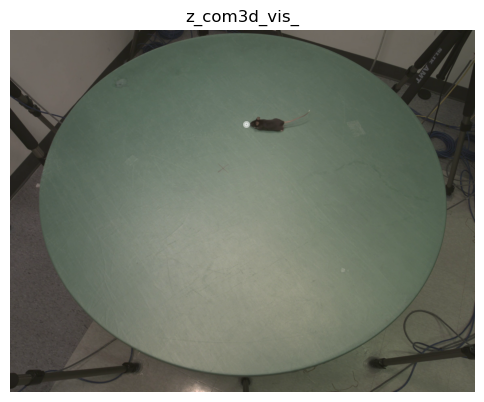

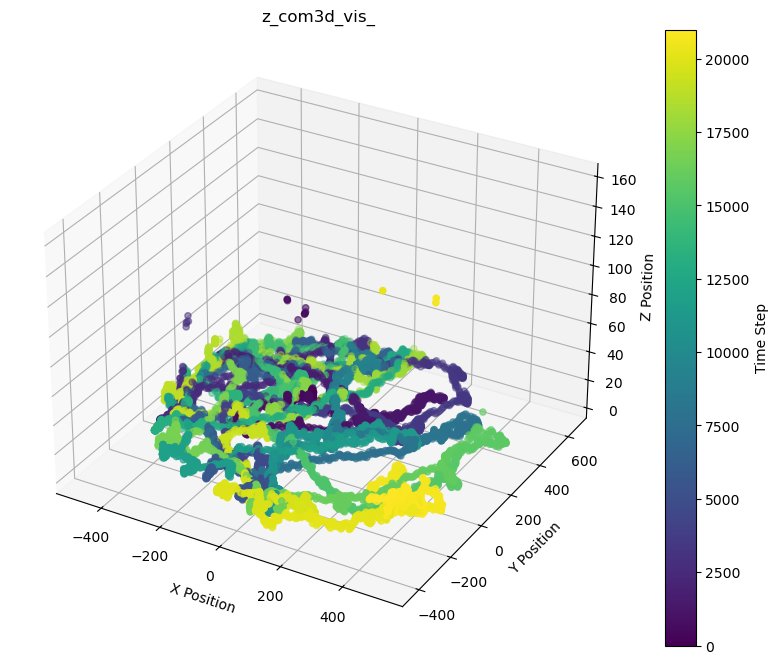

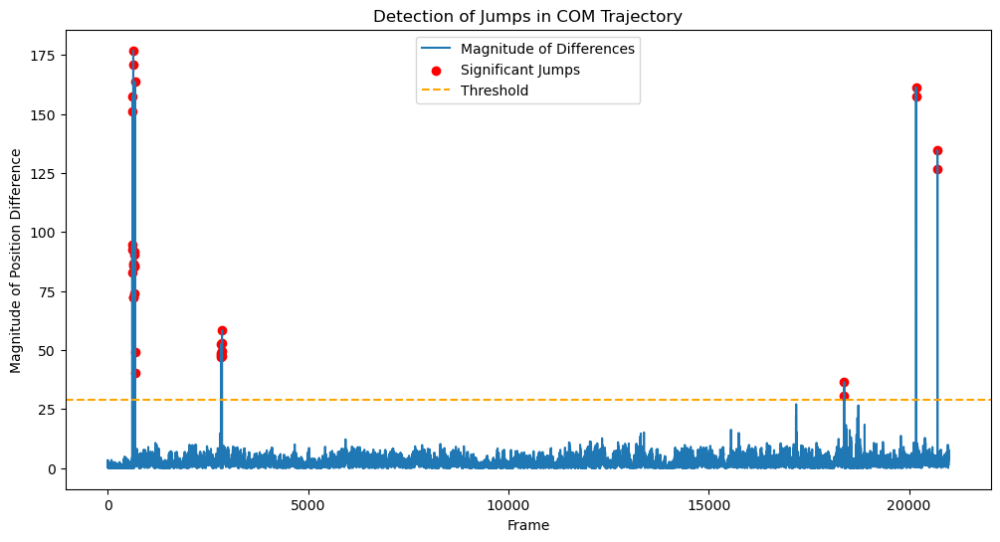

saved into npy. Frames with significant jumps: [  614   615   618   622   625   634   637   639   641   652   653   654
   655   657   658   668   686   687   688  2827  2828  2830  2831  2851
  2852  2853  2855 18378 18379 20173 20174 20706 20708]
33
N_FRAMES 33
pred_2d 33


100%|██████████| 33/33 [00:50<00:00,  1.54s/it]


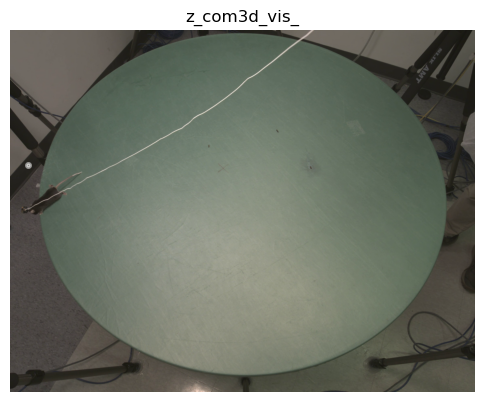

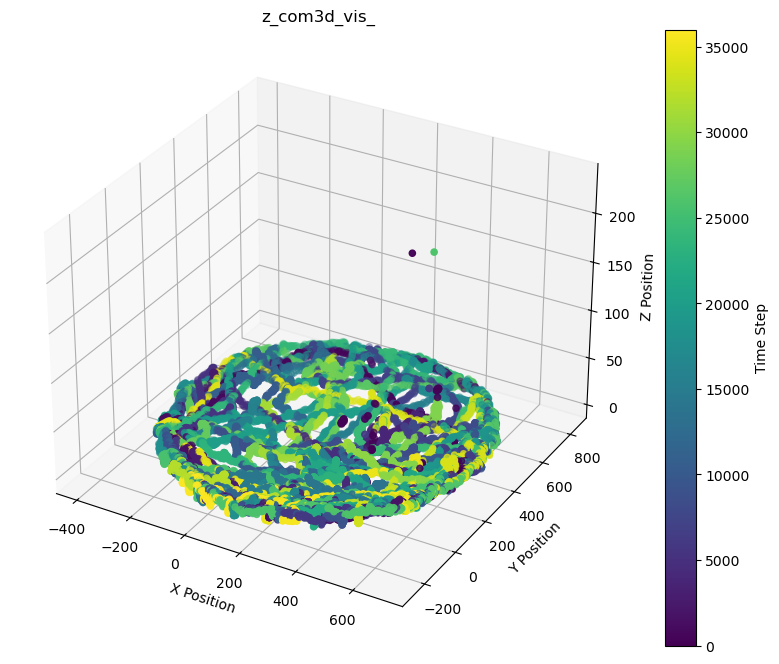

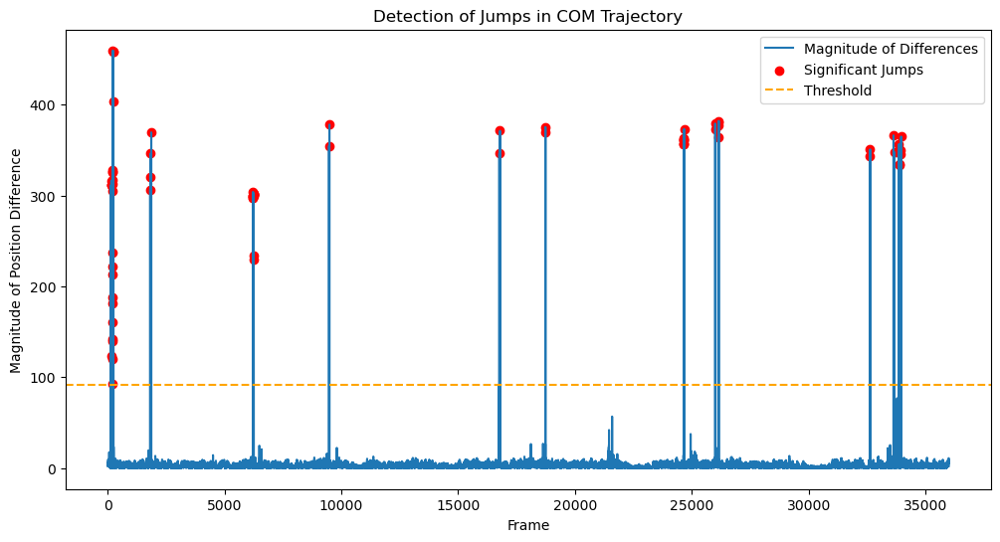

saved into npy. Frames with significant jumps: [  151   152   156   158   183   189   190   191   194   200   201   203
   205   207   208   209   210   214   216   218   221   225   245   246
   248  1819  1826  1841  1867  6219  6221  6223  6224  6225  6226  6234
  6236  6246  6248  6250  6251  6253  6255  9473  9490 16760 16789 18734
 18736 24646 24649 24652 24654 24655 24658 24665 24667 25997 25998 26131
 26150 26151 26152 32623 32627 33627 33654 33861 33887 33902 33939 33944
 33954]
73
N_FRAMES 73
pred_2d 73


100%|██████████| 73/73 [02:36<00:00,  2.14s/it]


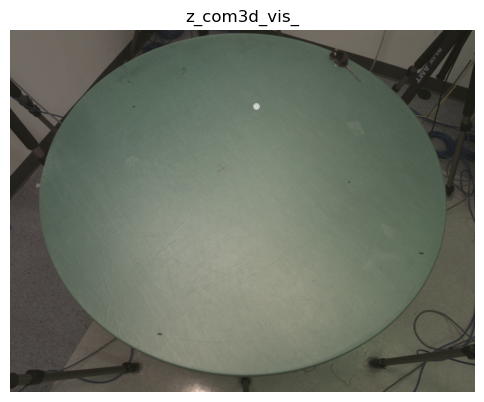

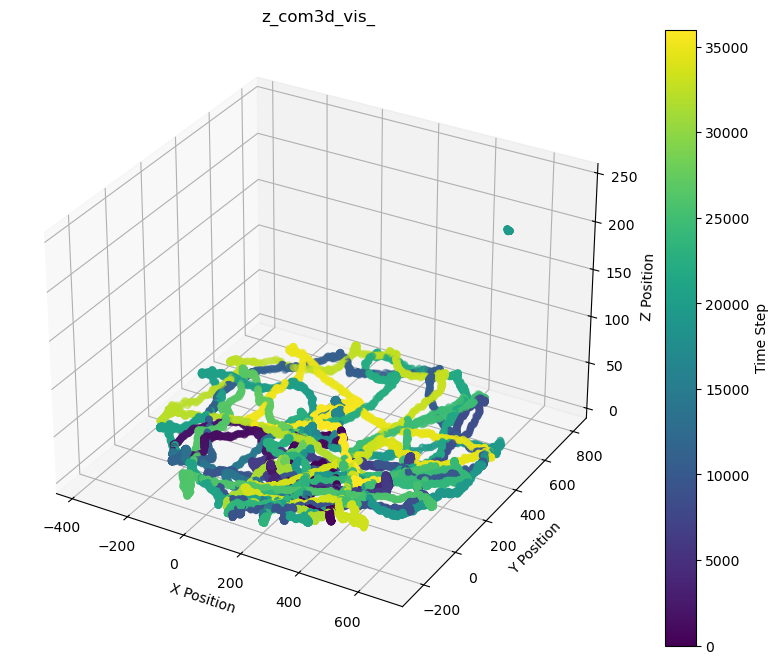

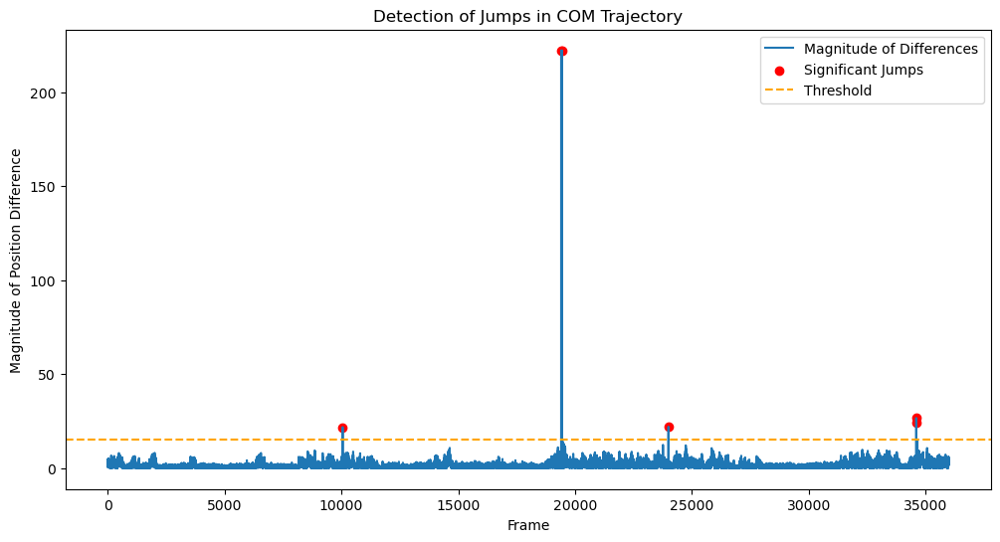

saved into npy. Frames with significant jumps: [10056 19406 19442 23995 34593 34597]
6
N_FRAMES 6
pred_2d 6


100%|██████████| 6/6 [00:40<00:00,  6.74s/it]


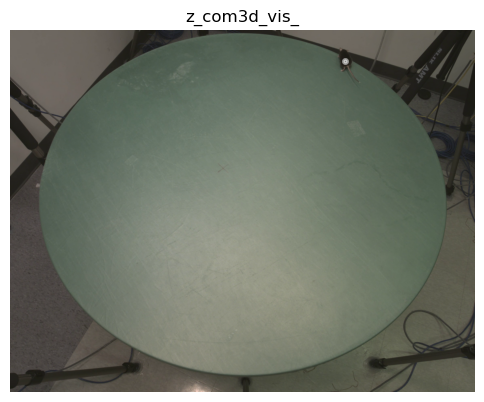

In [2]:
# weired_folders = [
# #     # "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_03/1691486_left_right_caffeine_1448",
# #     # "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_03/1691486_left_caffeine_1051",
# #     # "/home/lq53/mir_data/24summ/2024_07_10/1691485_no_hole_habituation_13_59"
# #     # "/home/lq53/mir_data/24summ/2024_06_26/1686940_left"
# #     # base_paths = [ 
# #     # below 3 need to process from strach.
# #     # '/home/lq53/mir_data/24summ/2024_06_26/1686940_left', #validation set
# #     # '/home/lq53/mir_data/24summ/2024_06_28/1686941_left_right_2', 
# #     # '/home/lq53/mir_data/24summ/2024_07_12/240605PMC1_right_hole_11_27',
# #     # # labels
# #     "/home/lq53/mir_data/24summ/2024_07_10/1691485_no_hole_habituation_13_59",
# #     "/home/lq53/mir_data/24summ/2024_07_11/1691485BMCFF1505",
# #     "/home/lq53/mir_data/24summ/2024_07_10/1691485_left_hole_saline_10_35",
# #     "/home/lq53/mir_data/24summ/2024_07_03/1691486_left_right_habituation",
# #     "/home/lq53/mir_data/24summ/2024_07_19/240605PMC_window2_right2holes_12_14",
# #     #below are my labels.
# #     # "/home/lq53/mir_data/24summ/2024_07_03/1691486_left_right_habituation",
# #     # "/home/lq53/mir_data/24summ/2024_07_12/240605PMC1_right_hole_11_27" #this one did not work
# #     "/home/lq53/mir_data/24summ/2024_07_16/1691485RMHBN1405",
# #     "/home/lq53/mir_data/24summ/2024_07_15/1691485RMPBS1659",
# #     "/home/lq53/mir_data/24summ/2024_07_19/240605PMC_window2_right2holes_11_30",
# #     "/home/lq53/mir_data/24summ/2024_07_15/1691485RMHBN1425",
# #     "/home/lq53/mir_data/24summ/2024_07_15/1691485RMPBF1531"
# #     # 'G:\\Videos\\6cam\\lq53\\Mir_intrinsics\\pyxy3d_noT'
# #     # '/n/olveczky_lab_tier1/Lab/dannce_rig2/data/M1-M7_photometry/Alone', SYNTAX_ERROR_UPDATE_THIS_WITH_YOUR_OWN_FILES
# #     # '/n/holylabs/LABS/olveczky_lab/Lab/dannce-dev/hannah-data/COM_DANNCE_TRAINING'
# # # ]
# # ]
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_10/1691485_no_hole_habituation_13_59",
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_11/1691485BMCFF1505",
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_10/1691485_left_hole_saline_10_35",
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_03/1691486_left_right_habituation",
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_19/240605PMC_window2_right2holes_12_14",
#     #below are my labels.
#     # "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_03/1691486_left_right_habituation"
#     # "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_12/240605PMC1_right_hole_11_27" #this one did not work
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_16/1691485RMHBN1405",
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_15/1691485RMPBS1659",
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_19/240605PMC_window2_right2holes_11_30",
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_15/1691485RMHBN1425",
#     "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ/2024_07_15/1691485RMPBF1531",
# ]

# for wie in weired_folders:
#     # note that there exist a function plot_com_all which i wrote before that can easily do below, 
#     # but for somereason i used this just that we can be a bit more flexible in terms of the name of the folders and stuff...

#     # /home/lq53/mir_data/24summ/2024_06_26/1686940_left/COM_df/predict_results//vis/vis_combined_Camera2_1000_from_0.mp4
#     com_foler = os.path.join(wie, 'COM_df_z/predict_results')
#     com_path = os.path.join(com_foler, 'com3d.mat')   
#     com_folder_save = os.path.join(com_foler, 'vis')
#     if not os.path.exists(com_folder_save):
#         os.makedirs(com_folder_save)
#     graph_title = "z_com3d_vis_"
    
#     com_data = load_data(com_path)

#     plot_3d_trajectory(com_data, graph_title, com_folder_save)
#     jump_indices = detect_jumps(com_data, com_folder_save)

#     # # # produce video, which is not necessary if not labeling more com to detect what's wrong


#     save_path = com_folder_save # os.path.join(com_foler, 'vis') #os.path.join(pred_path, 'vis')
#     if not os.path.exists(save_path):
#         os.makedirs(save_path)
#     base_folder = wie
#     base_base_folder = os.path.dirname(base_folder)
#     generate_jump_video(com_data, base_folder, jump_indices, graph_title, save_path, cam='Camera1')
#     # generate_com_video(com_data, base_folder, graph_title, save_path, cam='Camera1')
# # generate_com_video_choice # without that much things, just generate. quick iteration made for one click pipeline...

    